In [1]:
!pip install pandas 
!pip install numpy 
!pip install matplotlib 
!pip install sklearn

In [2]:
!pip install seaborn --upgrade

In [3]:
!pip install pandas_profiling --upgrade

In [4]:
import seaborn as sbn

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

In [6]:
%matplotlib inline

In [7]:
from pandas import read_excel, DataFrame, Series

In [8]:
##Ознакомление с данными

In [9]:
#Импорт Excel файла № 1

In [10]:
df1 = pd.read_excel("C:/Users/home/Desktop/Data scientist/X_nup.xlsx", index_col = 0)
df1

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,0.0,4.000000,57.000000
1.0,0.0,4.000000,60.000000
2.0,0.0,4.000000,70.000000
3.0,0.0,5.000000,47.000000
4.0,0.0,5.000000,57.000000
...,...,...,...
1035.0,90.0,8.088111,47.759177
1036.0,90.0,7.619138,66.931932
1037.0,90.0,9.800926,72.858286
1038.0,90.0,10.079859,65.519479


In [11]:
#Разведочный анализ импортированных данных

In [12]:
from pandas_profiling import ProfileReport 
ProfileReport(df1)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
#Импорт Excel файла № 2

In [14]:
df2 = pd.read_excel("C:/Users/home/Desktop/Data scientist/X_bp.xlsx", index_col = 0)
df2

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000
...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067


In [15]:
#Разведочный анализ импортированных данных

In [16]:
from pandas_profiling import ProfileReport 
ProfileReport(df2)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
#Объединение файлов 1 и 2 

In [18]:
df = df1.merge(df2, left_index = True, right_index = True, how = 'inner')
df

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0.0,0.0,4.000000,57.000000,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000
1.0,0.0,4.000000,60.000000,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000
2.0,0.0,4.000000,70.000000,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000
3.0,0.0,5.000000,47.000000,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000
4.0,0.0,5.000000,57.000000,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018.0,90.0,9.076380,47.019770,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
1019.0,90.0,10.565614,53.750790,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
1020.0,90.0,4.161154,67.629684,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021.0,90.0,6.313201,58.261074,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067


In [19]:
#Разведочный анализ объeдиненных данных

In [20]:
>>> df.shape

(1023, 13)

In [21]:
>>> df = df.drop_duplicates()
>>> df.shape

(1023, 13)

In [22]:
df.isnull().mean() * 100

Угол нашивки, град                      0.0
Шаг нашивки                             0.0
Плотность нашивки                       0.0
Соотношение матрица-наполнитель         0.0
Плотность, кг/м3                        0.0
модуль упругости, ГПа                   0.0
Количество отвердителя, м.%             0.0
Содержание эпоксидных групп,%_2         0.0
Температура вспышки, С_2                0.0
Поверхностная плотность, г/м2           0.0
Модуль упругости при растяжении, ГПа    0.0
Прочность при растяжении, МПа           0.0
Потребление смолы, г/м2                 0.0
dtype: float64

In [23]:
df.corr()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
"Угол нашивки, град",1.000000,0.023616,0.107947,-0.031073,-0.068474,-0.025417,0.038570,0.008052,0.020695,0.052299,0.023003,0.023398,-0.015334
Шаг нашивки,0.023616,1.000000,0.003487,0.036437,-0.061015,-0.009875,0.014887,0.003022,0.025795,0.038332,-0.029468,-0.059547,0.013394
Плотность нашивки,0.107947,0.003487,1.000000,-0.004652,0.080304,0.056346,0.017248,-0.039073,0.011391,-0.049923,0.006476,0.019604,0.012239
Соотношение матрица-наполнитель,-0.031073,0.036437,-0.004652,1.000000,0.003841,0.031700,-0.006445,0.019766,-0.004776,-0.006272,-0.008411,0.024148,0.072531
"Плотность, кг/м3",-0.068474,-0.061015,0.080304,0.003841,1.000000,-0.009647,-0.035911,-0.008278,-0.020695,0.044930,-0.017602,-0.069981,-0.015937
"модуль упругости, ГПа",-0.025417,-0.009875,0.056346,0.031700,-0.009647,1.000000,0.024049,-0.006804,0.031174,-0.005306,0.023267,0.041868,0.001840
"Количество отвердителя, м.%",0.038570,0.014887,0.017248,-0.006445,-0.035911,0.024049,1.000000,-0.000684,0.095193,0.055198,-0.065929,-0.075375,0.007446
"Содержание эпоксидных групп,%_2",0.008052,0.003022,-0.039073,0.019766,-0.008278,-0.006804,-0.000684,1.000000,-0.009769,-0.012940,0.056828,-0.023899,0.015165
"Температура вспышки, С_2",0.020695,0.025795,0.011391,-0.004776,-0.020695,0.031174,0.095193,-0.009769,1.000000,0.020121,0.028414,-0.031763,0.059954
"Поверхностная плотность, г/м2",0.052299,0.038332,-0.049923,-0.006272,0.044930,-0.005306,0.055198,-0.012940,0.020121,1.000000,0.036702,-0.003210,0.015692


In [24]:
sbn.heatmap(df.corr());


In [25]:
df.describe()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,44.252199,6.899222,57.153929,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144
std,45.015793,2.563467,12.350969,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931
min,0.000000,0.000000,0.000000,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026
25%,0.000000,5.080033,49.799212,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520
50%,0.000000,6.916144,57.341920,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882
75%,90.000000,8.586293,64.944961,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724
max,90.000000,14.440522,103.988901,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628


In [26]:
sbn.boxplot(x = df["Соотношение матрица-наполнитель"]);

In [27]:
sbn.boxplot(x = df["Плотность, кг/м3"]);

In [28]:
sbn.boxplot(x = df["модуль упругости, ГПа"]);

In [29]:
sbn.boxplot(x = df["Количество отвердителя, м.%"]);

In [30]:
sbn.boxplot(x = df["Содержание эпоксидных групп,%_2"]);

In [31]:
sbn.boxplot(x = df["Температура вспышки, С_2"]);

In [32]:
sbn.boxplot(x = df["Поверхностная плотность, г/м2"]);

In [33]:
sbn.boxplot(x = df["Модуль упругости при растяжении, ГПа"]);

In [34]:
sbn.boxplot(x = df["Прочность при растяжении, МПа"]);

In [35]:
sbn.boxplot(x = df['Потребление смолы, г/м2']);

In [36]:
sbn.boxplot(x = df['Угол нашивки, град']);

In [37]:
sbn.boxplot(x = df['Шаг нашивки']);

In [38]:
sbn.boxplot(x = df['Плотность нашивки']);

In [39]:
#Удаляем выбросы

In [40]:
for x in df.columns:
    q75,q25 = np.percentile(df.loc[:,x],[75,25])
    intr_qr = q75-q25

    max = q75+(1.5*intr_qr)
    min = q25-(1.5*intr_qr)

    df.loc[df[x] < min,x] = np.nan
    df.loc[df[x] > max,x] = np.nan

In [41]:
df.isnull().sum()

Угол нашивки, град                       0
Шаг нашивки                              4
Плотность нашивки                       21
Соотношение матрица-наполнитель          6
Плотность, кг/м3                         9
модуль упругости, ГПа                    2
Количество отвердителя, м.%             14
Содержание эпоксидных групп,%_2          2
Температура вспышки, С_2                 8
Поверхностная плотность, г/м2            2
Модуль упругости при растяжении, ГПа     6
Прочность при растяжении, МПа           11
Потребление смолы, г/м2                  8
dtype: int64

In [42]:
df = df.dropna(axis = 0)

In [43]:
for col in df.columns:
        sbn.catplot(y = col, data = df, kind = 'box')
        plt.title(col, fontsize = 13) 

In [44]:
#После удаления выбросов нормализуем данные

In [45]:
scaler = MinMaxScaler()
n_df = pd.DataFrame(scaler.fit_transform(df),
           columns = df.columns, index = df.index)

In [46]:
n_df.describe()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
count,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000
mean,0.511752,0.502232,0.513776,0.498933,0.502695,0.446764,0.504664,0.491216,0.516059,0.373733,0.488647,0.495706,0.521141
std,0.500129,0.183258,0.191342,0.187489,0.187779,0.199583,0.188865,0.180620,0.190624,0.217078,0.191466,0.188915,0.195781
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.372211,0.390482,0.372274,0.368517,0.301243,0.376190,0.367716,0.386128,0.205619,0.359024,0.365149,0.392067
50%,1.000000,0.504258,0.516029,0.494538,0.511229,0.447061,0.506040,0.489382,0.515980,0.354161,0.485754,0.491825,0.523766
75%,1.000000,0.624604,0.638842,0.629204,0.624999,0.580446,0.637978,0.623410,0.646450,0.538683,0.615077,0.612874,0.652447
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [47]:
#Множественная линейная регрессия переменной "Прочность при растяжении", нормализированные данные

In [48]:
target = n_df['Прочность при растяжении, МПа']
train = n_df.drop(['Прочность при растяжении, МПа'], axis = 1)

In [49]:
from sklearn.model_selection import train_test_split
x_train, x_test, Y_train, Y_test = train_test_split(target, train, test_size = 0.3)

In [50]:
>>> Y_train.shape

(655, 12)

In [51]:
x_train = [x_train]
x_train = np.array(x_train).reshape(-1,1)
x_train.shape

(655, 1)

In [52]:
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(x_train, Y_train)

LinearRegression()

In [54]:
x_test = [x_test]
x_test = np.array(x_test).reshape(-1,1)
x_test.shape

(281, 1)

In [55]:
pred = regressor.predict(x_test)

In [56]:
coeff_df = pd.DataFrame(regressor.coef_, columns=['Coefficient'])
coeff_df

,Coefficient
0,0.064838
1,-0.050617
2,0.022170
3,0.035002
4,-0.089926
5,0.034927
6,-0.090632
7,0.019561
8,-0.021470
9,-0.038791


In [57]:
dt = pd.DataFrame({'Actual': [Y_test], 'Predicted':[pred]})
dt

,Actual,Predicted
0,"Угол нашивки, град Шаг нашивки Плотн...","[[0.4889252434759212, 0.5264071548530256, 0.51..."


In [59]:
from sklearn import metrics 
print('Mean Absolute Error:', metrics.mean_absolute_error(Y_test, pred)) 
print('Mean Squared Error:', metrics.mean_squared_error(Y_test, pred)) 
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(Y_test, pred)))
print('R^2_score Error:', metrics.r2_score(Y_test, pred))

Mean Absolute Error: 0.18228242659200888
Mean Squared Error: 0.054082576275665185
Root Mean Squared Error: 0.23255660875508394
R^2_score Error: -0.007154166977809323


In [60]:
#Вывод: Линейная зависимость параметра "Прочность при растяжении" от любых других параметров отсутствует

In [61]:
#Множественная линейная регрессия переменной "Прочность при растяжении",  исходные данные:

In [62]:
X = df['Прочность при растяжении, МПа']
y = df.drop(['Прочность при растяжении, МПа'], axis = 1)

In [63]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [64]:
>>> X_train.shape

(655,)

In [65]:
X_train = [X_train]
X_train = np.array(X_train).reshape(-1,1)
X_train.shape

(655, 1)

In [66]:
>>> y_train.shape

(655, 12)

In [67]:
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression()

In [69]:
X_test = [X_test]
X_test = np.array(X_test).reshape(-1,1)
X_test.shape

(281, 1)

In [70]:
pred = regressor.predict(X_test)

In [71]:
ini_array1 = np.array(X_test)

In [72]:
coeff_df = pd.DataFrame(regressor.coef_, columns=['Coefficient'])
coeff_df

,Coefficient
0,0.000036
1,-0.000455
2,0.000938
3,0.000109
4,-0.009249
5,0.045670
6,-0.002098
7,-0.000188
8,-0.000930
9,0.005471


In [73]:
dt = pd.DataFrame({'Actual': [y_test], 'Predicted': [pred]})
dt

,Actual,Predicted
0,"Угол нашивки, град Шаг нашивки Плотн...","[[45.88871301955085, 7.049876843070625, 57.176..."


In [74]:
from sklearn import metrics 
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, pred)) 
print('Mean Squared Error:', metrics.mean_squared_error(y_test, pred)) 
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, pred)))
print('R^2_score Error:', metrics.r2_score(y_test, pred))

Mean Absolute Error: 58.609305391928125
Mean Squared Error: 16059.054461947386
Root Mean Squared Error: 126.72432466558023
R^2_score Error: -0.005030798340521521


In [75]:
#Вывод: Линейная зависимость параметра "Прочность при растяжении" от любых других параметров отсутствует.

In [76]:
#Прогноз переменной "Модуль упругости при растяжении", метод Случайный лес регрессия

In [77]:
cols = n_df.columns.tolist()
cols

['Угол нашивки, град',
 'Шаг нашивки',
 'Плотность нашивки',
 'Соотношение матрица-наполнитель',
 'Плотность, кг/м3',
 'модуль упругости, ГПа',
 'Количество отвердителя, м.%',
 'Содержание эпоксидных групп,%_2',
 'Температура вспышки, С_2',
 'Поверхностная плотность, г/м2',
 'Модуль упругости при растяжении, ГПа',
 'Прочность при растяжении, МПа',
 'Потребление смолы, г/м2']

In [78]:
cols = cols[-2:] + cols[:-2]
cols

['Прочность при растяжении, МПа',
 'Потребление смолы, г/м2',
 'Угол нашивки, град',
 'Шаг нашивки',
 'Плотность нашивки',
 'Соотношение матрица-наполнитель',
 'Плотность, кг/м3',
 'модуль упругости, ГПа',
 'Количество отвердителя, м.%',
 'Содержание эпоксидных групп,%_2',
 'Температура вспышки, С_2',
 'Поверхностная плотность, г/м2',
 'Модуль упругости при растяжении, ГПа']

In [79]:
n_df = n_df[cols]
n_df

,"Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа"
1.0,0.712590,0.529221,0.0,0.289334,0.557156,0.274768,0.651097,0.447061,0.079153,0.607435,0.509164,0.162230,0.280303
3.0,0.712590,0.529221,0.0,0.362355,0.335840,0.274768,0.651097,0.447061,0.630983,0.418887,0.583596,0.162230,0.280303
4.0,0.712590,0.529221,0.0,0.362355,0.506083,0.466552,0.651097,0.455721,0.511257,0.495653,0.509164,0.162230,0.280303
5.0,0.712590,0.529221,0.0,0.362355,0.557156,0.465836,0.571539,0.452685,0.511257,0.495653,0.509164,0.162230,0.280303
6.0,0.712590,0.529221,0.0,0.362355,0.727399,0.424236,0.332865,0.488508,0.511257,0.495653,0.509164,0.162230,0.280303
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018.0,0.463043,0.207613,1.0,0.660014,0.336177,0.361662,0.444480,0.552781,0.337550,0.333908,0.703458,0.161609,0.475147
1019.0,0.452087,0.182974,1.0,0.768759,0.450768,0.607674,0.704373,0.268550,0.749605,0.294428,0.362087,0.271207,0.464422
1020.0,0.575296,0.585446,1.0,0.301102,0.687046,0.573391,0.498274,0.251612,0.501991,0.623085,0.334063,0.572959,0.578740
1021.0,0.334513,0.451779,1.0,0.458245,0.527552,0.662497,0.748688,0.448724,0.717585,0.267818,0.466417,0.496511,0.535142


In [80]:
X = n_df.iloc[:, 0:12].values 
y = n_df.iloc[:, 12].values 

In [81]:
from sklearn.model_selection import train_test_split 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0) 

In [82]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score

In [83]:
regressor = RandomForestRegressor(n_estimators=20, random_state=0)
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

In [84]:
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print('R^2_score Error:', metrics.r2_score(y_test, y_pred))

Mean Absolute Error: 0.14348222361170396
Mean Squared Error: 0.03190646998906916
Root Mean Squared Error: 0.17862382256874126
R^2_score Error: -0.035993737631330625


In [85]:
data = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
data

,Actual,Predicted
0,0.486101,0.493406
1,0.312930,0.396416
2,0.628885,0.586739
3,0.431090,0.524612
4,0.547037,0.451086
...,...,...
276,0.647522,0.618443
277,0.267834,0.550897
278,0.535142,0.465424
279,0.292358,0.488180


In [86]:
#Подбор параметров модели

In [87]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

In [88]:
grid_param = {'bootstrap': [True, False],
               'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'n_estimators': [130, 180, 230]}

In [89]:
n_df_rf = RandomizedSearchCV(estimator = regressor, 
                     scoring="neg_mean_squared_error", 
                     param_distributions = grid_param,
                     n_iter = 50,
                     cv = 10,
                     verbose=2,
                     random_state=42,
                     n_jobs = -1)

In [90]:
n_df_rf.fit(X_train, y_train) 

Fitting 10 folds for each of 50 candidates, totalling 500 fits


RandomizedSearchCV(cv=10,
                   estimator=RandomForestRegressor(n_estimators=20,
                                                   random_state=0),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [130, 180, 230]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

In [91]:
best_result = n_df_rf.best_score_
print(best_result)

-0.04089001179178375


In [92]:
pred = n_df_rf.predict(X_train)

In [93]:
from sklearn import metrics 
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, pred)) 
print('Mean Squared Error:', metrics.mean_squared_error(y_train, pred)) 
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_train, pred)))
print('R^2_score Error:', metrics.r2_score(y_train, pred))

Mean Absolute Error: 0.11743482924541274
Mean Squared Error: 0.021096601611389005
Root Mean Squared Error: 0.14524669225627482
R^2_score Error: 0.4605562695453339


In [94]:
n_df_rf.best_params_
n_df_rf.best_score_
n_df_rf.best_estimator_

RandomForestRegressor(max_depth=10, max_features='sqrt', min_samples_leaf=2,
                      min_samples_split=10, n_estimators=230, random_state=0)

In [95]:
grid_param_model = {'bootstrap': [True, False],
               'max_depth': [10],
               'max_features': ['sqrt'],
               'min_samples_leaf': [2],
               'min_samples_split': [10],
               'n_estimators': [230]}

In [96]:
#Модель с подобранными параметрами и ее обучение на тестовой выборке

In [97]:
n_df_rf_model = RandomizedSearchCV(estimator = regressor, 
                     scoring="neg_mean_squared_error", 
                     param_distributions = grid_param,
                     n_iter = 50,
                     cv = 10,
                     verbose=2,
                     random_state=0,
                     n_jobs = -1)

In [98]:
n_df_rf_model.fit(X_test, y_test)

Fitting 10 folds for each of 50 candidates, totalling 500 fits


RandomizedSearchCV(cv=10,
                   estimator=RandomForestRegressor(n_estimators=20,
                                                   random_state=0),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [130, 180, 230]},
                   random_state=0, scoring='neg_mean_squared_error', verbose=2)

In [99]:
best_result = n_df_rf_model.best_score_
print(best_result) 

-0.03331465915629258


In [100]:
pred = n_df_rf_model.predict(X_test)

In [101]:
from sklearn import metrics 
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, pred)) 
print('Mean Squared Error:', metrics.mean_squared_error(y_test, pred)) 
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, pred)))
print('R^2_score Error:', metrics.r2_score(y_test, pred))

Mean Absolute Error: 0.09459203224639602
Mean Squared Error: 0.014833901932404121
Root Mean Squared Error: 0.12179450698781173
R^2_score Error: 0.5183475479464563


In [102]:
data = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
data

,Actual,Predicted
0,0.486101,0.493406
1,0.312930,0.396416
2,0.628885,0.586739
3,0.431090,0.524612
4,0.547037,0.451086
...,...,...
276,0.647522,0.618443
277,0.267834,0.550897
278,0.535142,0.465424
279,0.292358,0.488180


In [103]:
#Нейросеть матрица-наполнитель

In [104]:
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import GridSearchCV  

In [105]:
cols = n_df.columns.tolist()
cols

['Прочность при растяжении, МПа',
 'Потребление смолы, г/м2',
 'Угол нашивки, град',
 'Шаг нашивки',
 'Плотность нашивки',
 'Соотношение матрица-наполнитель',
 'Плотность, кг/м3',
 'модуль упругости, ГПа',
 'Количество отвердителя, м.%',
 'Содержание эпоксидных групп,%_2',
 'Температура вспышки, С_2',
 'Поверхностная плотность, г/м2',
 'Модуль упругости при растяжении, ГПа']

In [106]:
cols = cols[-7:] + cols[:-7]
cols

['Плотность, кг/м3',
 'модуль упругости, ГПа',
 'Количество отвердителя, м.%',
 'Содержание эпоксидных групп,%_2',
 'Температура вспышки, С_2',
 'Поверхностная плотность, г/м2',
 'Модуль упругости при растяжении, ГПа',
 'Прочность при растяжении, МПа',
 'Потребление смолы, г/м2',
 'Угол нашивки, град',
 'Шаг нашивки',
 'Плотность нашивки',
 'Соотношение матрица-наполнитель']

In [107]:
n_df = n_df[cols]
n_df

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель
1.0,0.651097,0.447061,0.079153,0.607435,0.509164,0.162230,0.280303,0.712590,0.529221,0.0,0.289334,0.557156,0.274768
3.0,0.651097,0.447061,0.630983,0.418887,0.583596,0.162230,0.280303,0.712590,0.529221,0.0,0.362355,0.335840,0.274768
4.0,0.651097,0.455721,0.511257,0.495653,0.509164,0.162230,0.280303,0.712590,0.529221,0.0,0.362355,0.506083,0.466552
5.0,0.571539,0.452685,0.511257,0.495653,0.509164,0.162230,0.280303,0.712590,0.529221,0.0,0.362355,0.557156,0.465836
6.0,0.332865,0.488508,0.511257,0.495653,0.509164,0.162230,0.280303,0.712590,0.529221,0.0,0.362355,0.727399,0.424236
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018.0,0.444480,0.552781,0.337550,0.333908,0.703458,0.161609,0.475147,0.463043,0.207613,1.0,0.660014,0.336177,0.361662
1019.0,0.704373,0.268550,0.749605,0.294428,0.362087,0.271207,0.464422,0.452087,0.182974,1.0,0.768759,0.450768,0.607674
1020.0,0.498274,0.251612,0.501991,0.623085,0.334063,0.572959,0.578740,0.575296,0.585446,1.0,0.301102,0.687046,0.573391
1021.0,0.748688,0.448724,0.717585,0.267818,0.466417,0.496511,0.535142,0.334513,0.451779,1.0,0.458245,0.527552,0.662497


In [108]:
train = n_df.iloc[:, 0:12].values 
target = n_df.iloc[:, 12].values 

In [109]:
xtrn, xtest, ytrn, ytest = train_test_split( train,target, test_size=0.3)

In [110]:
print('Train/Размеры теста : ', xtrn.shape, xtest.shape, ytrn.shape, ytest.shape)

Train/Размеры теста :  (655, 12) (281, 12) (655,) (281,)


In [111]:
#Модель с параметрами по умолчанию

In [112]:
mlp_regressor  = MLPRegressor(random_state=123)
mlp_regressor.fit(xtrn, ytrn)

MLPRegressor(random_state=123)

In [145]:
ypreds = mlp_regressor.predict(xtest)
print(ypreds[:10])
print(ytest[:10])

from sklearn import metrics
print('R^2_score Error:', metrics.r2_score(ytest, ypreds))

[0.52880721 0.53914291 0.46615581 0.45926224 0.54205699 0.49435022
 0.45742919 0.50743523 0.53579031 0.53953347]
[[0.85904292]
 [0.34416599]
 [0.44516945]
 [0.41387004]
 [0.47964056]
 [0.61985016]
 [0.80390985]
 [0.60885655]
 [0.57354955]
 [0.42671321]]
R^2_score Error: -0.03506807928412181


In [147]:
print("Loss : ", mlp_regressor.loss_)

Loss :  0.015656173353129653


In [148]:
print("Number of Intercepts : ", len(mlp_regressor.intercepts_))
[intercept.shape for intercept in mlp_regressor.intercepts_]

Number of Intercepts :  2


[(100,), (1,)]

In [149]:
print("Number of Iterations for Which Estimator Ran : ", mlp_regressor.n_iter_)

Number of Iterations for Which Estimator Ran :  34


In [150]:
print("Name of Output Layer Activation Function : ", mlp_regressor.out_activation_)

Name of Output Layer Activation Function :  identity


In [118]:
#Подбор параметров модели

In [159]:
%%time

params = {'activation': ['relu', 'tanh', 'logistic', 'identity'],
          'hidden_layer_sizes':  [(100,), (1,)],
          'solver': ['sgd', 'adam'],
          'alpha': [0.00001,0.0001],
          'learning_rate' : ['constant', 'adaptive', 'invscaling'],
          'verbose':[1]
         }

mlp_regressor_grid = GridSearchCV(MLPRegressor(), params, n_jobs=-1, cv=10)
mlp_regressor_grid.fit(xtrn,ytrn)


Iteration 1, loss = 0.25401160
Iteration 2, loss = 0.11464813
Iteration 3, loss = 0.03952228
Iteration 4, loss = 0.01724243
Iteration 5, loss = 0.02378329
Iteration 6, loss = 0.03148787
Iteration 7, loss = 0.03001983
Iteration 8, loss = 0.02313154
Iteration 9, loss = 0.01785284
Iteration 10, loss = 0.01700913
Iteration 11, loss = 0.01812701
Iteration 12, loss = 0.01860258
Iteration 13, loss = 0.01786058
Iteration 14, loss = 0.01712019
Iteration 15, loss = 0.01686552
Iteration 16, loss = 0.01695874
Iteration 17, loss = 0.01699936
Iteration 18, loss = 0.01690421
Iteration 19, loss = 0.01682625
Iteration 20, loss = 0.01681200
Iteration 21, loss = 0.01681451
Iteration 22, loss = 0.01680139
Iteration 23, loss = 0.01681611
Iteration 24, loss = 0.01679540
Iteration 25, loss = 0.01678563
Iteration 26, loss = 0.01678678
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Wall time: 3min 30s


GridSearchCV(cv=10, estimator=MLPRegressor(), n_jobs=-1,
             param_grid={'activation': ['relu', 'tanh', 'logistic', 'identity'],
                         'alpha': [1e-05, 0.0001],
                         'hidden_layer_sizes': [(100,), (1,)],
                         'learning_rate': ['constant', 'adaptive',
                                           'invscaling'],
                         'solver': ['sgd', 'adam'], 'verbose': [1]})

In [160]:
print('Best Parameters : ',mlp_regressor_grid.best_params_)

Best Parameters :  {'activation': 'logistic', 'alpha': 0.0001, 'hidden_layer_sizes': (100,), 'learning_rate': 'invscaling', 'solver': 'adam', 'verbose': 1}


In [121]:
#Модель с найденными параметрами обучаем на тренировочной и тестовой выборках 

In [161]:
mlp_ = MLPRegressor(activation= 'logistic',
     alpha= 0.0001,
     batch_size = 'auto',
     beta_1 = 0.9,
     beta_2 = 0.999,
     early_stopping = False,
     epsilon = 1e-08,
     hidden_layer_sizes = (100,),
     learning_rate = 'invscaling',
     learning_rate_init = 0.001,
     max_fun = 15000,
     max_iter = 200,
     momentum = 0.9,
     n_iter_no_change = 10,
     nesterovs_momentum= True,
     power_t = 0.5,
     random_state = None,
     shuffle = True,
     solver = 'adam',
     tol = 0.0001,
     validation_fraction = 0.1,
     verbose = 1,
     warm_start = False)

In [162]:
mlp_.fit(xtrn,  ytrn)

Iteration 1, loss = 0.70539665
Iteration 2, loss = 0.44023019
Iteration 3, loss = 0.24554652
Iteration 4, loss = 0.11775796
Iteration 5, loss = 0.04787884
Iteration 6, loss = 0.02025159
Iteration 7, loss = 0.01833214
Iteration 8, loss = 0.02491209
Iteration 9, loss = 0.03001133
Iteration 10, loss = 0.02992280
Iteration 11, loss = 0.02605754
Iteration 12, loss = 0.02147046
Iteration 13, loss = 0.01833630
Iteration 14, loss = 0.01705758
Iteration 15, loss = 0.01704310
Iteration 16, loss = 0.01740674
Iteration 17, loss = 0.01758875
Iteration 18, loss = 0.01745362
Iteration 19, loss = 0.01720365
Iteration 20, loss = 0.01697161
Iteration 21, loss = 0.01688639
Iteration 22, loss = 0.01692116
Iteration 23, loss = 0.01693430
Iteration 24, loss = 0.01693699
Iteration 25, loss = 0.01690060
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.


MLPRegressor(activation='logistic', learning_rate='invscaling', verbose=1)

In [163]:
expected_y  = ytest
predicted_y = mlp_.predict(xtest)

In [164]:
from sklearn import metrics 
print('Mean Absolute Error:', metrics.mean_absolute_error(ytest, predicted_y)) 
print('Mean Squared Error:', metrics.mean_squared_error(ytest, predicted_y)) 
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(ytest, predicted_y)))
print('R^2_score Error:', metrics.r2_score(ytest, predicted_y))

Mean Absolute Error: 0.15856359232952066
Mean Squared Error: 0.04008760586985611
Root Mean Squared Error: 0.20021889488721115
R^2_score Error: -0.06403261965852591


In [165]:
import matplotlib.pyplot as plt 
%matplotlib inline

In [167]:
def plot_loss(mlp_):
        plt.plot(mlp_.loss_curve_, label = 'loss')
        plt.ylim([0, 1])
        plt.xlabel('Epoha')
        plt.ylabel('MAE: [Соотношение матрица-наполнитель]')
        plt.legend()
        plt.grid(True)


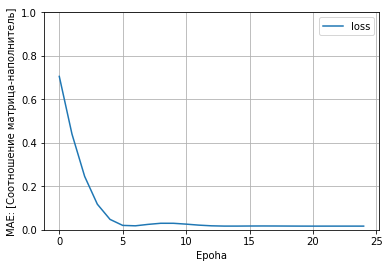

In [168]:
plot_loss(mlp_)


In [172]:
data = pd.DataFrame({'Actual': [expected_y] , 'Predicted': [predicted_y]})
data

,Actual,Predicted
0,"[[0.8590429191240267], [0.34416599172177353], ...","[0.4762688652655034, 0.4990172476640788, 0.459..."


In [173]:
res = mlp_.predict(xtest)
print (mlp_.coefs_)
print (mlp_.n_layers_)
print (mlp_.n_outputs_)
print (mlp_.out_activation_)
print ("res: ",res)

[array([[ 0.09184076, -0.13017277,  0.14903664, ...,  0.10820326,
        -0.07742304,  0.02952298],
       [ 0.04328579,  0.04882389, -0.04747331, ...,  0.02495717,
        -0.10571004,  0.05215904],
       [-0.07765255, -0.05560572,  0.03945159, ..., -0.10133321,
        -0.14852876, -0.10710133],
       ...,
       [ 0.06333751, -0.00682759, -0.07449481, ..., -0.03814853,
        -0.06004141, -0.10537435],
       [ 0.07158347, -0.09736904,  0.15130118, ...,  0.08703693,
        -0.03982114,  0.05927464],
       [-0.00325966,  0.09910304,  0.10846351, ..., -0.08733007,
         0.02860986, -0.02878488]]), array([[-0.0589689 ],
       [-0.00098639],
       [ 0.11035084],
       [ 0.06941889],
       [ 0.04645581],
       [-0.00665359],
       [-0.11912538],
       [-0.10648207],
       [ 0.11040756],
       [-0.05059167],
       [-0.04691728],
       [ 0.09208166],
       [ 0.13758989],
       [-0.03108015],
       [-0.11464846],
       [-0.0562616 ],
       [ 0.10978913],
       [-0.

In [180]:
ytest = [ytest]
ytest = np.array(ytest).reshape(-1,1)
ytest.shape

(281, 1)

In [181]:
mlp_.fit(xtest,  ytest)

Iteration 1, loss = 0.38008623
Iteration 2, loss = 0.28286461
Iteration 3, loss = 0.20127063
Iteration 4, loss = 0.13644638
Iteration 5, loss = 0.08734145
Iteration 6, loss = 0.05336965
Iteration 7, loss = 0.03257853
Iteration 8, loss = 0.02204073
Iteration 9, loss = 0.01988857
Iteration 10, loss = 0.02266079
Iteration 11, loss = 0.02744062
Iteration 12, loss = 0.03217552
Iteration 13, loss = 0.03492927
Iteration 14, loss = 0.03533518
Iteration 15, loss = 0.03369459
Iteration 16, loss = 0.03063419
Iteration 17, loss = 0.02726456
Iteration 18, loss = 0.02408292
Iteration 19, loss = 0.02176628
Iteration 20, loss = 0.02019774
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.


C:\Users\home\anaconda3\envs\vkr1\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1599: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


MLPRegressor(activation='logistic', learning_rate='invscaling', verbose=1)

In [182]:
expected_y  = ytest
predicted_y = mlp_.predict(xtest)

In [183]:
from sklearn import metrics 
print('Mean Absolute Error:', metrics.mean_absolute_error(ytest, predicted_y)) 
print('Mean Squared Error:', metrics.mean_squared_error(ytest, predicted_y)) 
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(ytest, predicted_y)))
print('Mean_squared_log_error Error:', metrics.r2_score(ytest, predicted_y))
print('R^2_score Error:', metrics.mean_squared_log_error(expected_y, predicted_y))

Mean Absolute Error: 0.15833629305902805
Mean Squared Error: 0.039633686106710746
Root Mean Squared Error: 0.19908210895685916
Mean_squared_log_error Error: -0.0519843712232777
R^2_score Error: 0.018210268562086913


In [184]:
import matplotlib.pyplot as plt 
%matplotlib inline

In [186]:
def plot_loss(mlp_):
        plt.plot(mlp_.loss_curve_, label = 'loss')
        plt.ylim([0, 0.5])
        plt.xlabel('Epoha')
        plt.ylabel('MAE:[Соотношение матрица-наполнитель]')
        plt.legend()
        plt.grid(True)


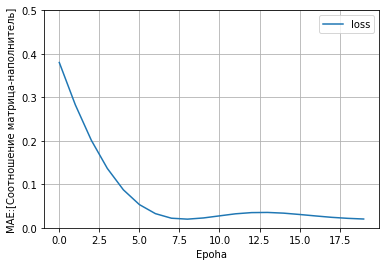

In [187]:
plot_loss(mlp_)

In [188]:
#Коэффициент детерминации близок к 0, что говорит об отсутствии обобщающей способности у этой модели нейросети.
#Соотношение матрица-наполнитель эта нейросеть предсказать не может.